# PhysiCell Data Loader

### Verifica que todas las simulaciones hayan terminado correctamente

In [1]:
import pandas as pd
import pcdl
import os
import glob

# Define la ruta base donde están las carpetas de simulaciones
base_path = '/media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000'

# Lista todas las carpetas dentro de outputs que comiencen con "output_k"
# sim_folders = [f for f in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, f)) and f.startswith("output_")]

# Lista todas las carpetas dentro de outputs que comiencen con "output_" y terminen con "rep1" o "rep2"
sim_folders = [f for f in os.listdir(base_path) 
               if os.path.isdir(os.path.join(base_path, f)) 
               and f.startswith("rule") 
               and any(f.endswith(f"rep{i}") for i in range(1, 11))]


# Crear DataFrame vacío para almacenar resultados
df_final = pd.DataFrame()

for folder in sim_folders:
    pathfiles = os.path.join(base_path, folder)

    # Verificar si el archivo final.svg existe en la carpeta
    final_svg_path = os.path.join(pathfiles, "final.svg")
    if not os.path.exists(final_svg_path):
        print(f"No se encontró final.svg en {folder}, saltando esta carpeta.")
        continue

    # Buscar el último archivo XML (mayor número en el nombre)
    xml_files = sorted(glob.glob(f"{pathfiles}/final.xml"))
    if not xml_files:
        print(f"No se encontraron archivos XML en {folder}")
        continue
    
    last_file = xml_files[-1]  # Último archivo ordenado por nombre

    # Cargar el archivo de datos
    mcds = pcdl.TimeStep(last_file)
    df_cell = mcds.get_cell_df()

    # Extraer información del número de células por tipo
    df_celltype = df_cell.loc[:, ['cell_type', 'time']].copy()
    s_time = str(df_celltype['time'].iloc[0])
    df_celltype.columns = ['cell_type', s_time]
    df_count = df_celltype.groupby('cell_type').count()

    # Agregar el total de células
    df_count.loc['Total de agentes'] = df_count.sum(axis=0)

    # Añadir los datos al DataFrame final con el nombre de la simulación
    df_count.columns = [folder]  # Usamos el nombre de la carpeta como columna
    df_final = pd.concat([df_final, df_count], axis=1)

reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rule9_vs_rule10_HM2.0_5.0_rep7/PhysiCell_settings.xml
reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rule9_vs_rule10_HM2.0_5.0_rep7/final.xml
working on metadata ...
working on mesh data ...
reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rule9_vs_rule10_HM2.0_5.0_rep7/initial_mesh0.mat
working on microenvironment data ...
reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rule9_vs_rule10_HM2.0_5.0_rep7/final_microenvironment0.mat
parsing: debris data
parsing: oxygen data
parsing: IFN-gamma data
parsing: IL-10 data
parsing: IL-4 data
parsing: antigen data
working on discrete cell data ...
reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rule9_vs_rule10_HM2.0_5.0_rep7/final_cells.mat
working on graph data ...
reading: /media/rodolfo/FE761CFD761CB7FB/Ubuntu/Simulaciones/outputs/MPSA_1000/rul

In [ ]:
# df_final.T.to_csv("df_MPSA_1000_1to10_reps.csv", index=True)

In [3]:
import pandas as pd
df_final = pd.read_csv("df_MPSA_1000_1to10_reps.csv", index_col=0).T  
print(df_final)

                  rule9_vs_rule10_HM2.0_5.0_rep7  \
CD8_T_cell                                  39.0   
M0_macrophage                                1.0   
M1_macrophage                               28.0   
M2_macrophage                              225.0   
exhausted_T_cell                           590.0   
naive_T_cell                                47.0   
tumor                                     1129.0   
Total de agentes                          2059.0   

                  rule9_vs_rule10_HM2.0_5.0_rep8  \
CD8_T_cell                                  35.0   
M0_macrophage                                1.0   
M1_macrophage                               27.0   
M2_macrophage                              225.0   
exhausted_T_cell                           552.0   
naive_T_cell                                58.0   
tumor                                     1188.0   
Total de agentes                          2086.0   

                  rule9_vs_rule10_HM2.0_5.0_rep9  \
CD8_T_cell

## Calcula el valor promedio del número de celulas de las simulaciones

In [4]:
import re
import pandas as pd

# Copiar df_final como base
df = df_final.copy()

# Patrón de regex para identificar columnas (comparaciones y variaciones individuales)
pattern_vs = r"rule(\d+)_vs_rule(\d+)_HM(\d+\.\d+)_(\d+\.\d+)_rep\d+"
pattern_single = r"rule(\d+)_HM(\d+\.\d+)_rep\d+"  

# Agrupar columnas que coinciden con cada patrón
grouped_columns = {}

for col in df.columns:
    match_vs = re.search(pattern_vs, col)
    match_single = re.search(pattern_single, col)

    if match_vs:
        param1, param2 = int(match_vs.group(1)), int(match_vs.group(2))
        value1, value2 = float(match_vs.group(3)), float(match_vs.group(4))
        base_name = f"rule{param1}_vs_rule{param2}_HM{value1}_{value2}"
    
    elif match_single:
        param = int(match_single.group(1))
        value = float(match_single.group(2))
        base_name = f"rule{param}_HM{value}"
    
    else:
        continue  # Si no coincide con ninguno de los patrones, ignorar

    if base_name not in grouped_columns:
        grouped_columns[base_name] = []
    grouped_columns[base_name].append(col)

# Crear un nuevo DataFrame para los promedios
df_avg = df.copy()  # Copiamos df para preservar todas las filas

# Usamos un diccionario de listas para almacenar los promedios antes de concatenarlos
avg_data = {}

for base_name, cols in grouped_columns.items():
    avg_data[base_name] = df[cols].mean(axis=1)  # Calcular el promedio de cada conjunto

# Concatenar los datos promediados en un DataFrame final
df_avg = pd.DataFrame(avg_data)

# Revisar si se mantienen las filas correctas
print(df_avg.info())  # Verifica número de filas y columnas
print(df_avg)  # Muestra las primeras filas para revisión


<class 'pandas.core.frame.DataFrame'>
Index: 8 entries, CD8_T_cell to Total de agentes
Columns: 760 entries, rule9_vs_rule10_HM2.0_5.0 to rule1_HM0.5
dtypes: float64(760)
memory usage: 47.6+ KB
None
                  rule9_vs_rule10_HM2.0_5.0  rule9_vs_rule10_HM5.0_0.2  \
CD8_T_cell                             31.4                       29.2   
M0_macrophage                           1.0                        1.1   
M1_macrophage                          22.8                       19.4   
M2_macrophage                         233.2                      230.8   
exhausted_T_cell                      560.2                      565.0   
naive_T_cell                           45.9                       49.1   
tumor                                1192.9                     1210.5   
Total de agentes                     2087.4                     2105.1   

                  rule9_vs_rule10_HM5.0_0.5  rule4_vs_rule9_HM2.0_5.0  \
CD8_T_cell                             34.1                  

## Mapas de calor

### Mapas individuales separados

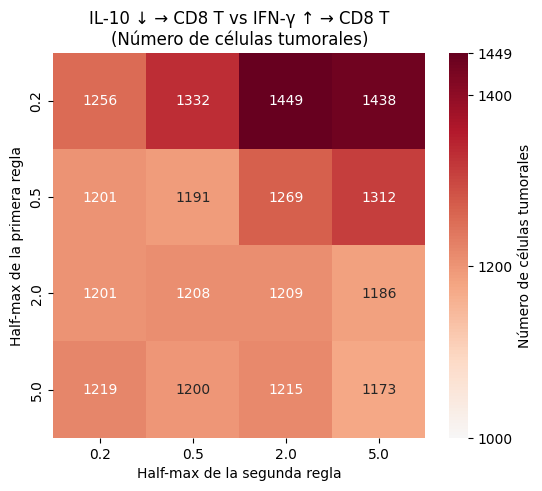

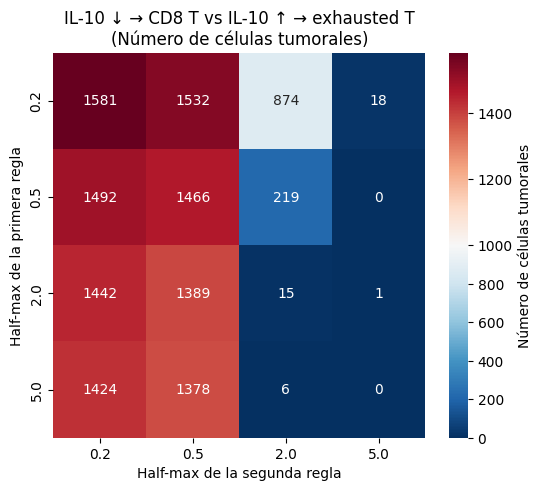

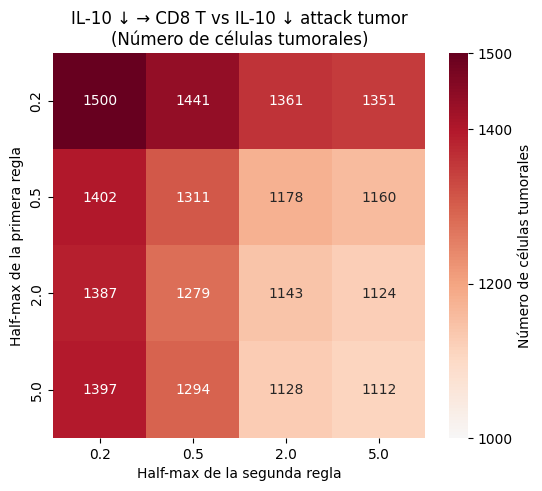

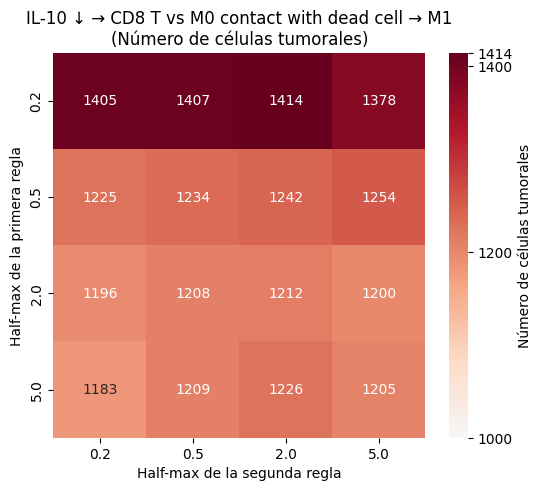

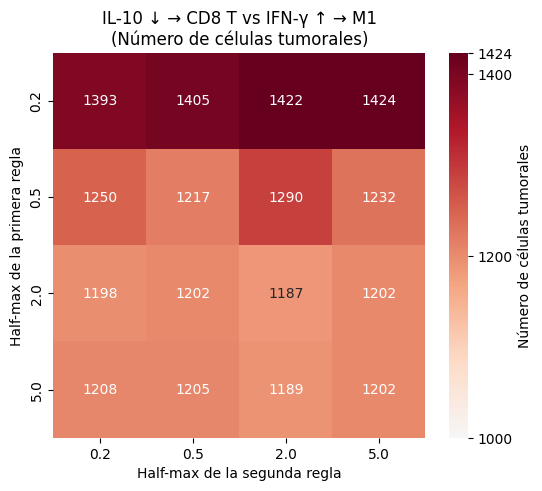

...

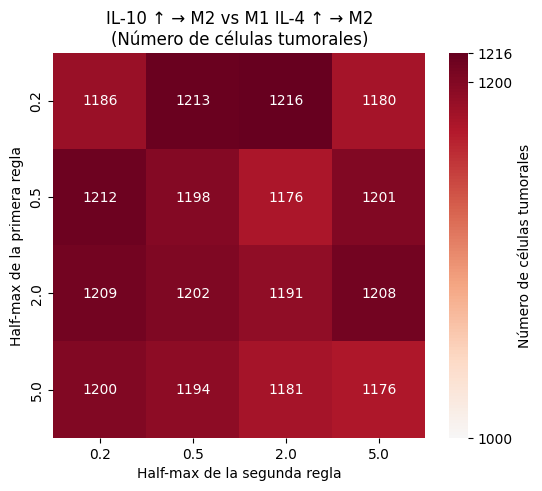

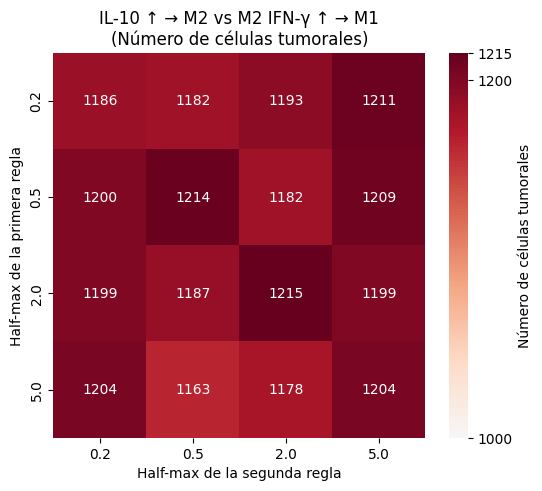

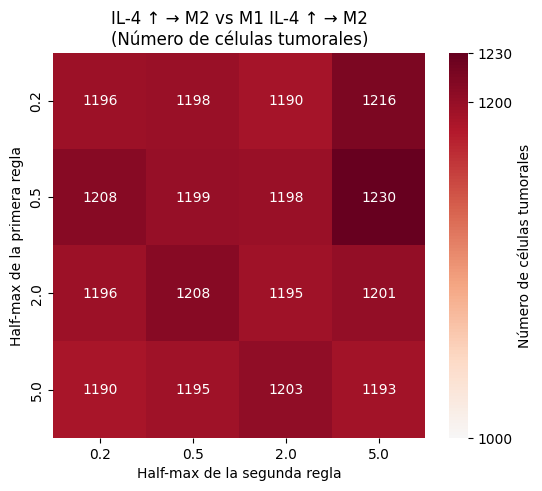

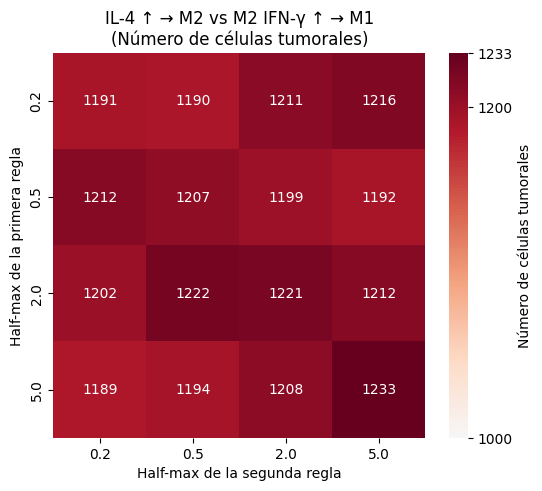

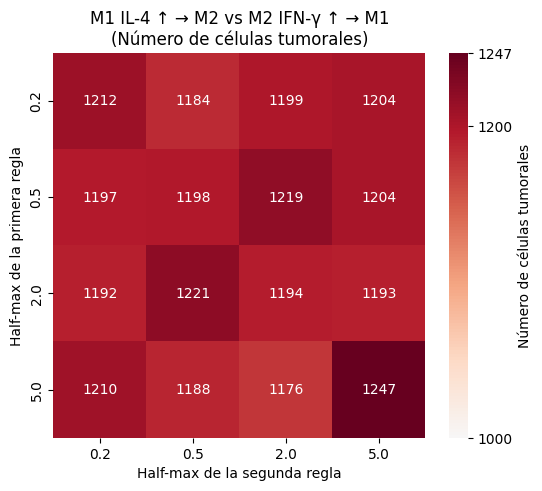

In [38]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Tipo de célula de interés
cell_type = "tumor"

# Patrón correcto para extraer los valores de las reglas desde los nombres de columnas
pattern = r"rule(\d+)_vs_rule(\d+)_HM(\d+\.\d+)_(\d+\.\d+)"

# Extraer los valores de los parámetros desde los nombres de columnas
parsed_columns = {}
for col in df.columns:
    match = re.search(pattern, col)
    if match:
        rule1, rule2, HM1, HM2 = match.groups()
        rule1, rule2 = int(rule1), int(rule2)
        HM1, HM2 = map(float, (HM1, HM2))
        parsed_columns[col] = (rule1, HM1, rule2, HM2)

# Obtener valores únicos de Half-max por separado y ordenarlos
HM_values = sorted(set(val[1] for val in parsed_columns.values()))

# Crear diccionario para los heatmaps con todas las combinaciones de 2 reglas (10 reglas => 45 combinaciones)
heatmap_data = {
    f"Rule{r1}_vs_Rule{r2}": np.full((4, 4), np.nan)
    for r1 in range(1, 11) for r2 in range(r1 + 1, 11)
}

# Mapear valores a índices de 0 a 3 para cada conjunto de valores
HM_to_index = {v: i for i, v in enumerate(HM_values)}

# Llenar las matrices de datos con el número de células tumorales
for col, (rule1, HM1, rule2, HM2) in parsed_columns.items():
    index1 = HM_to_index[HM1]
    index2 = HM_to_index[HM2]
    
    key = f"Rule{rule1}_vs_Rule{rule2}"
    if key in heatmap_data:
        heatmap_data[key][index1, index2] = df.loc[cell_type, col]

# Nombres de las reglas para etiquetas
rule_titles = {
    1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    3: "IL-10 ↑ → exhausted T",
    4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "M1 IL-4 ↑ → M2",
    10: "M2 IFN-γ ↑ → M1"
}

# Función para graficar los mapas de calor con gradiente centrado en 1000
def plot_heatmap(data, title, x_labels, y_labels):
    # Reemplazar NaN por 0 para visualización
    data_for_plot = np.nan_to_num(data, nan=0.0)
    
    # Determinar el valor máximo dinámicamente
    max_val = np.max(data_for_plot)
    min_val = min(999, np.min(data_for_plot))
    
    # Normalizar: azul 0–1000, rojo 1001–max_val
    norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
    # norm = None

    plt.figure(figsize=(6, 5))
    ax = sns.heatmap(
        data_for_plot,
        annot=True,
        fmt=".0f",
        cmap="RdBu_r",
        xticklabels=x_labels,
        yticklabels=y_labels,
        norm=norm,
        cbar_kws={'label': 'Número de células tumorales'}
    )
    
    if min_val == 999:
        cbar = ax.collections[0].colorbar
        ticks = list(np.arange(1000, max_val, 200))
        if ticks[-1] != max_val:
            ticks.append(max_val)
        cbar.set_ticks(ticks)
        cbar.set_ticklabels([f"{t:.0f}" for t in ticks])
        cbar.ax.set_ylim(1000, max_val)

        
    plt.xlabel("Half-max de la segunda regla")
    plt.ylabel("Half-max de la primera regla")
    plt.title(title + "\n(Número de células tumorales)")
    plt.show()

for key, data in heatmap_data.items():
    rule1, rule2 = map(int, key.replace("Rule", "").split("_vs_"))
    title = f"{rule_titles[rule1]} vs {rule_titles[rule2]}"
    plot_heatmap(data, title, HM_values, HM_values)



### Mapas individuales juntos

/tmp/ipykernel_8779/1198122637.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


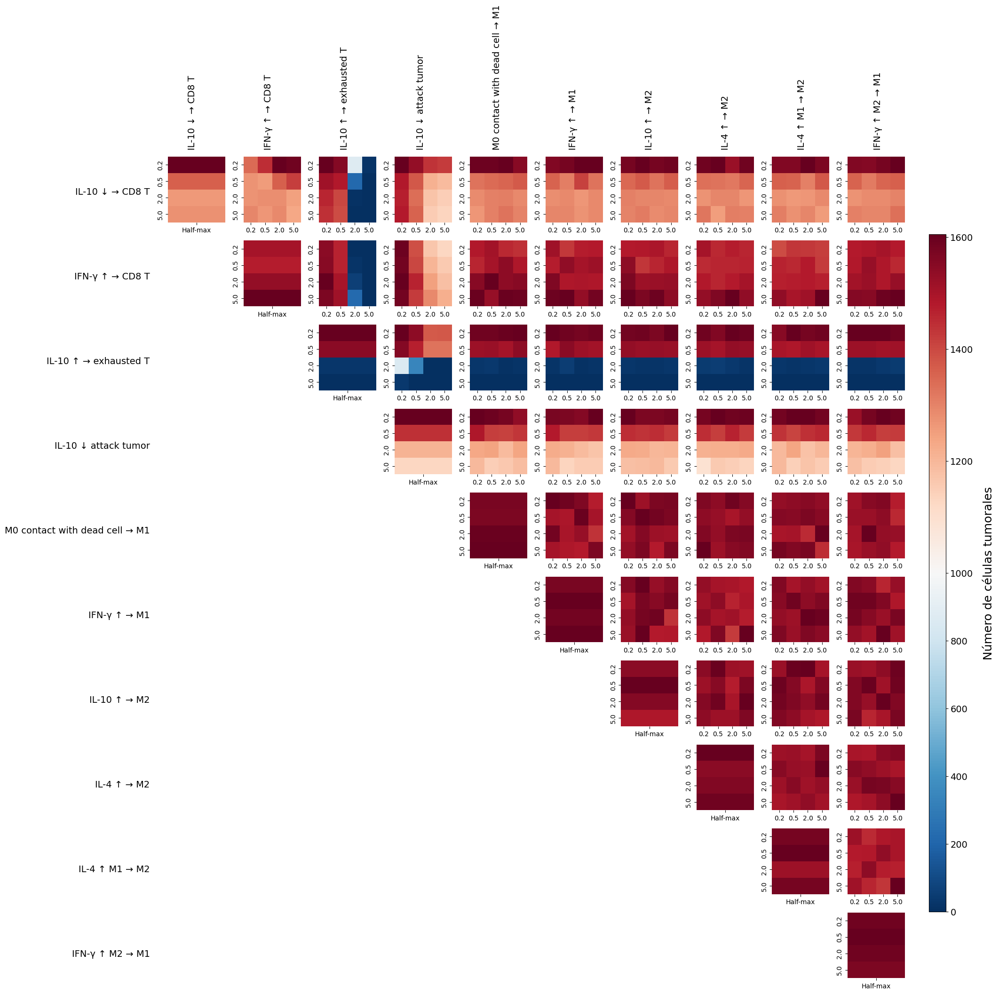

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Definir valores de Half-max
HM_values = [0.2, 0.5, 2.0, 5.0]

# Definir nombres de reglas para etiquetas
rule_titles = {
    1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    3: "IL-10 ↑ → exhausted T",
    4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "IL-4 ↑ M1 → M2",
    10: "IFN-γ ↑ M2 → M1"
}

# Crear una figura para la matriz de heatmaps
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(18, 18))

# Calcular el máximo global de las células tumorales en todas las combinaciones
max_val = np.nanmax([
    df.loc["tumor", col]
    for col in df.columns
    if col.startswith("rule") and not pd.isna(df.loc["tumor", col])
])

# Recorrer la matriz para llenar con los heatmaps
for i in range(10):
    for j in range(10):
        ax = axes[i, j]

        if i == j:
            # Heatmaps de variación individual (diagonal)
            pattern = rf"^rule{i+1}_HM(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM = float(match.group(1))
                    parsed_data[HM] = df.loc["tumor", col]

            # Crear matriz vacía y asignar valores
            heatmap_data = np.full((4, 1), np.nan)
            for HM, value in parsed_data.items():
                heatmap_data[HM_values.index(HM), 0] = value  

            # Reemplazar NaN por 0 para visualización
            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            # Normalización centrada en 1000
            norm = TwoSlopeNorm(vmin=0, vcenter=1000, vmax=np.nanmax(heatmap_data))

            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=["Half-max"], yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        elif i < j:
            # Heatmaps de comparación de reglas (parte superior)
            pattern = rf"^rule{i+1}_vs_rule{j+1}_HM(\d+\.\d+)_(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM1, HM2 = map(float, match.groups())
                    parsed_data[(HM1, HM2)] = df.loc["tumor", col]

            # Crear matriz vacía y asignar valores
            heatmap_data = np.full((4, 4), np.nan)
            for (HM1, HM2), value in parsed_data.items():
                heatmap_data[HM_values.index(HM1), HM_values.index(HM2)] = value  

            # Reemplazar NaN por 0 para visualización
            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)
            
            # Normalización centrada en 1000
            norm = TwoSlopeNorm(vmin=0, vcenter=1000, vmax=np.nanmax(heatmap_data))

            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=HM_values, yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        else:
            # Espacios vacíos en la parte inferior
            ax.axis("off")
            
# Agregar etiquetas en los márgenes izquierdo y superior
for i, rule in enumerate(rule_titles.values()):
    fig.text(0.0, 0.95 - i * 0.1, rule, va="center", ha="right", fontsize=14, rotation=0)
    fig.text(0.05 + i * 0.09, 1.0, rule, va="bottom", ha="center", fontsize=14, rotation=90)

# Agregar barra de color
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=TwoSlopeNorm(vmin=0, vcenter=1000, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax)

# Aumentar tamaño del texto en la barra de color
cbar.ax.set_ylabel("Número de células tumorales", fontsize=18, labelpad=15)
cbar.ax.tick_params(labelsize=14)

# Ajustar diseño
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


### Mapas juntos normalizados de forma global

In [44]:
print(max_val)

1605.3


/tmp/ipykernel_8779/706023059.py:113: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


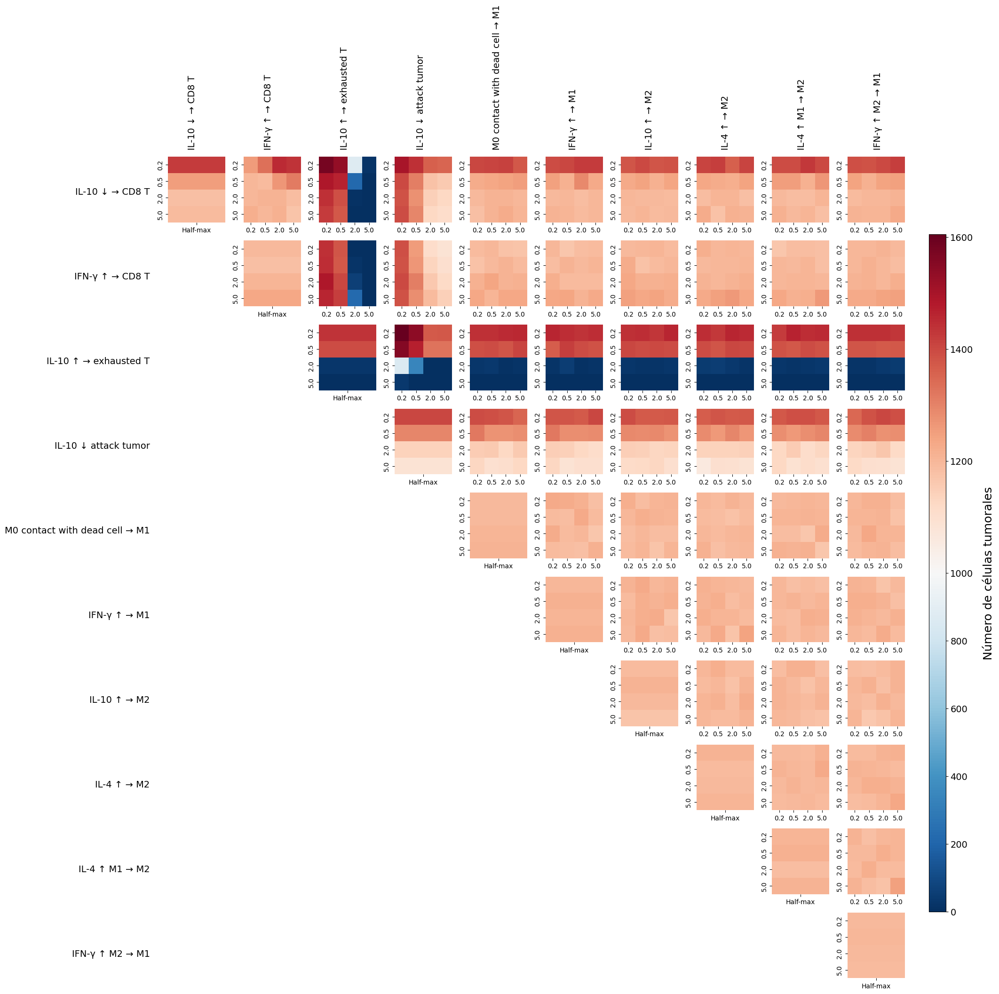

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Definir valores de Half-max
HM_values = [0.2, 0.5, 2.0, 5.0]

# Definir nombres de reglas para etiquetas
rule_titles = {
    1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    3: "IL-10 ↑ → exhausted T",
    4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "IL-4 ↑ M1 → M2",
    10: "IFN-γ ↑ M2 → M1"
}

# Crear una figura para la matriz de heatmaps
fig, axes = plt.subplots(nrows=10, ncols=10, figsize=(18, 18))

# Calcular el máximo global de las células tumorales en todas las combinaciones
max_val = np.nanmax([
    df.loc["tumor", col]
    for col in df.columns
    if col.startswith("rule") and not pd.isna(df.loc["tumor", col])
])

# Recorrer la matriz para llenar con los heatmaps
for i in range(10):
    for j in range(10):
        ax = axes[i, j]

        if i == j:
            # Heatmaps de variación individual (diagonal)
            pattern = rf"^rule{i+1}_HM(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM = float(match.group(1))
                    parsed_data[HM] = df.loc["tumor", col]

            # Crear matriz vacía y asignar valores
            heatmap_data = np.full((4, 1), np.nan)
            for HM, value in parsed_data.items():
                heatmap_data[HM_values.index(HM), 0] = value  

            # Reemplazar NaN por 0 para visualización
            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            # Normalización centrada en 1000
            norm = TwoSlopeNorm(vmin=0, vcenter=1000, vmax=max_val)

            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=["Half-max"], yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        elif i < j:
            # Heatmaps de comparación de reglas (parte superior)
            pattern = rf"^rule{i+1}_vs_rule{j+1}_HM(\d+\.\d+)_(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM1, HM2 = map(float, match.groups())
                    parsed_data[(HM1, HM2)] = df.loc["tumor", col]

            # Crear matriz vacía y asignar valores
            heatmap_data = np.full((4, 4), np.nan)
            for (HM1, HM2), value in parsed_data.items():
                heatmap_data[HM_values.index(HM1), HM_values.index(HM2)] = value  

            # Reemplazar NaN por 0 para visualización
            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)
            
            # Normalización centrada en 1000
            norm = TwoSlopeNorm(vmin=0, vcenter=1000, vmax=max_val)

            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=HM_values, yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        else:
            # Espacios vacíos en la parte inferior
            ax.axis("off")
            
# Agregar etiquetas en los márgenes izquierdo y superior
for i, rule in enumerate(rule_titles.values()):
    fig.text(0.0, 0.95 - i * 0.1, rule, va="center", ha="right", fontsize=14, rotation=0)
    fig.text(0.05 + i * 0.09, 1.0, rule, va="bottom", ha="center", fontsize=14, rotation=90)

# Agregar barra de color
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=TwoSlopeNorm(vmin=0, vcenter=1000, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax)

# Aumentar tamaño del texto en la barra de color
cbar.ax.set_ylabel("Número de células tumorales", fontsize=18, labelpad=15)
cbar.ax.tick_params(labelsize=14)

# Ajustar diseño
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


### Omitiendo la regla 3

/tmp/ipykernel_8779/1936916834.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


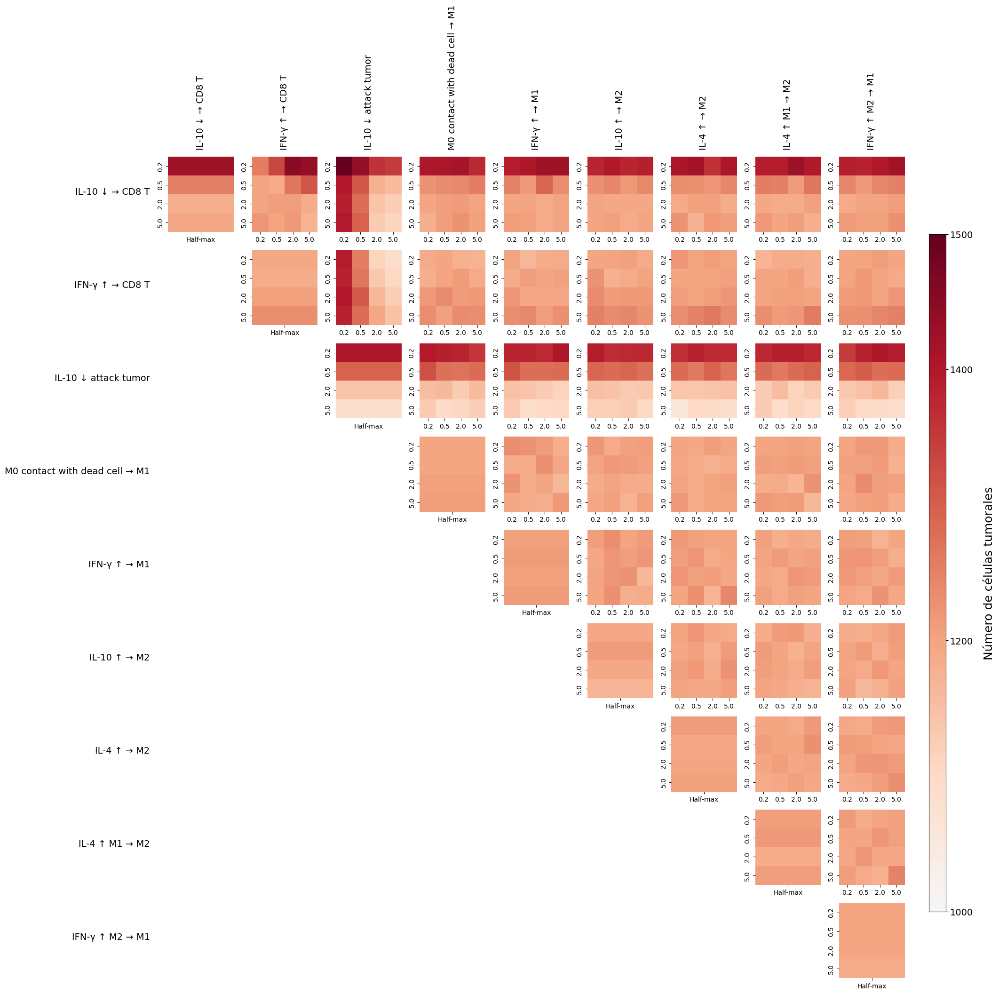

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Definir valores de Half-max
HM_values = [0.2, 0.5, 2.0, 5.0]

# Definir nombres de reglas para etiquetas (quitamos la 3)
rule_titles = {
    1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "IL-4 ↑ M1 → M2",
    10: "IFN-γ ↑ M2 → M1"
}

# Obtener las reglas que se usarán
rule_numbers = list(rule_titles.keys())
n_rules = len(rule_numbers)

# Crear una figura para la matriz de heatmaps
fig, axes = plt.subplots(nrows=n_rules, ncols=n_rules, figsize=(18, 18))

max_val = np.nanmax([
    df.loc["tumor", col]
    for col in df.columns
    if (
        col.startswith("rule") and
        "rule3" not in col and
        not pd.isna(df.loc["tumor", col])
    )
])

min_val = min(
    999,
    np.nanmin([
        df.loc["tumor", col]
        for col in df.columns
        if (
            col.startswith("rule") and
            "rule3" not in col and
            not pd.isna(df.loc["tumor", col])
        )
    ])
)

# Recorrer la matriz para llenar con los heatmaps
for i, rule_i in enumerate(rule_numbers):
    for j, rule_j in enumerate(rule_numbers):
        ax = axes[i, j]

        if rule_i == rule_j:
            # Heatmaps de variación individual (diagonal)
            pattern = rf"^rule{rule_i}_HM(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM = float(match.group(1))
                    parsed_data[HM] = df.loc["tumor", col]

            heatmap_data = np.full((4, 1), np.nan)
            for HM, value in parsed_data.items():
                heatmap_data[HM_values.index(HM), 0] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=["Half-max"], yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        elif rule_i < rule_j:
            # Heatmaps de comparación de reglas (parte superior)
            pattern = rf"^rule{rule_i}_vs_rule{rule_j}_HM(\d+\.\d+)_(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM1, HM2 = map(float, match.groups())
                    parsed_data[(HM1, HM2)] = df.loc["tumor", col]

            heatmap_data = np.full((4, 4), np.nan)
            for (HM1, HM2), value in parsed_data.items():
                heatmap_data[HM_values.index(HM1), HM_values.index(HM2)] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=HM_values, yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        else:
            # Espacios vacíos en la parte inferior
            ax.axis("off")

# Agregar etiquetas en los márgenes izquierdo y superior
for i, rule in enumerate(rule_titles.values()):
    fig.text(0.0, 0.95 - i * 0.11, rule, va="center", ha="right", fontsize=14, rotation=0)  # Izquierda
    fig.text(0.06 + i * 0.099, 1.0, rule, va="bottom", ha="center", fontsize=14, rotation=90)  # Arriba

# Agregar barra de color
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax)

# Recorte visual si no hay valores por debajo de 1000
if min_val == 999:
    cbar.ax.set_ylim(1000, max_val)
    # Definir ticks de 200 en 200 desde 1000 hasta incluir max_val
    ticks = list(np.arange(1000, max_val, 200))
    if ticks[-1] != max_val:
        ticks.append(max_val)
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f"{t:.0f}" for t in ticks])

# Etiqueta y tamaño de fuente
cbar.ax.set_ylabel("Número de células tumorales", fontsize=18, labelpad=15)
cbar.ax.tick_params(labelsize=14)

# Ajustar diseño
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


In [47]:
print(max_val)
print(min_val)

1499.5
999


### Omitiendo las reglas 3 y 4

/tmp/ipykernel_8779/3678815045.py:136: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


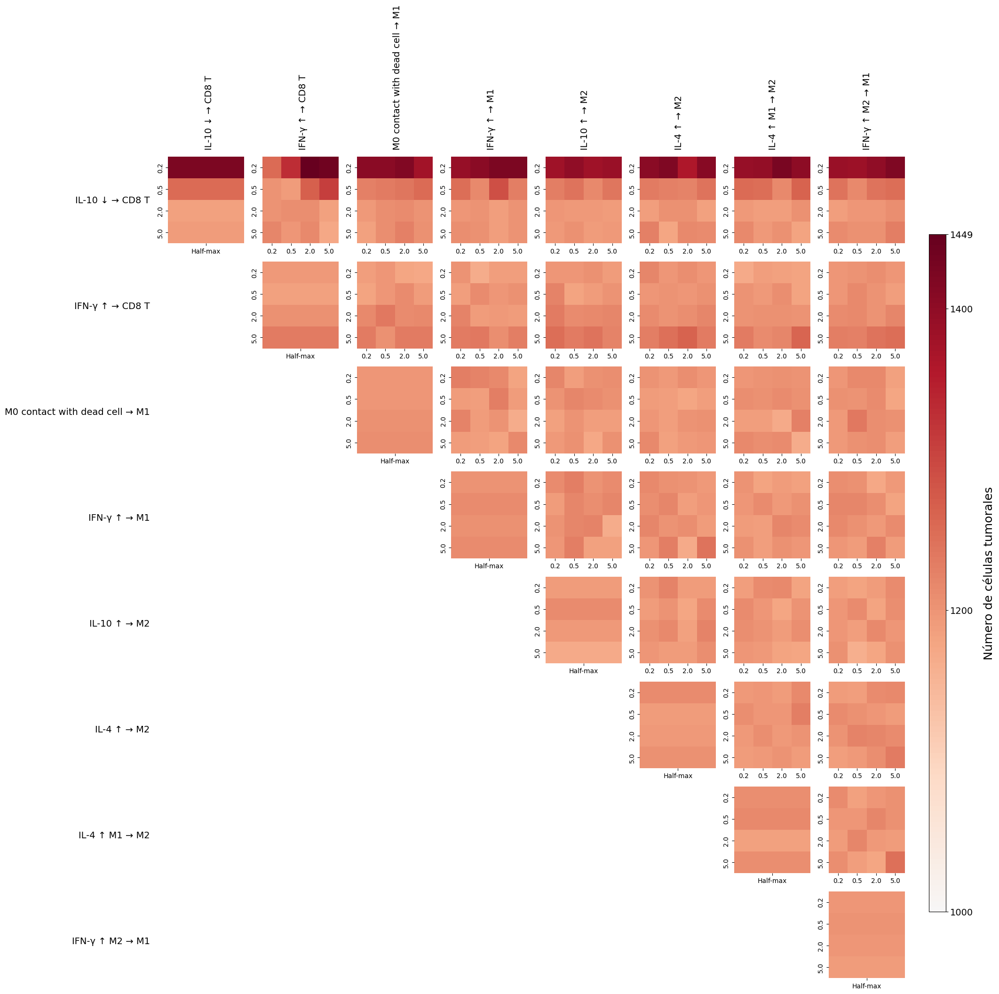

In [48]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Definir valores de Half-max
HM_values = [0.2, 0.5, 2.0, 5.0]

# Definir nombres de reglas para etiquetas (quitamos la 3)
rule_titles = {
    1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    # 4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "IL-4 ↑ M1 → M2",
    10: "IFN-γ ↑ M2 → M1"
}

# Obtener las reglas que se usarán
rule_numbers = list(rule_titles.keys())
n_rules = len(rule_numbers)

# Crear una figura para la matriz de heatmaps
fig, axes = plt.subplots(nrows=n_rules, ncols=n_rules, figsize=(18, 18))

max_val = np.nanmax([
    df.loc["tumor", col]
    for col in df.columns
    if (
        col.startswith("rule") and
        "rule3" not in col and
        "rule4" not in col and
        not pd.isna(df.loc["tumor", col])
    )
])

min_val = min(
    999,
    np.nanmin([
        df.loc["tumor", col]
        for col in df.columns
        if (
            col.startswith("rule") and
            "rule3" not in col and
            "rule4" not in col and
            not pd.isna(df.loc["tumor", col])
        )
    ])
)

# Recorrer la matriz para llenar con los heatmaps
for i, rule_i in enumerate(rule_numbers):
    for j, rule_j in enumerate(rule_numbers):
        ax = axes[i, j]

        if rule_i == rule_j:
            # Heatmaps de variación individual (diagonal)
            pattern = rf"^rule{rule_i}_HM(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM = float(match.group(1))
                    parsed_data[HM] = df.loc["tumor", col]

            heatmap_data = np.full((4, 1), np.nan)
            for HM, value in parsed_data.items():
                heatmap_data[HM_values.index(HM), 0] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=["Half-max"], yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        elif rule_i < rule_j:
            # Heatmaps de comparación de reglas (parte superior)
            pattern = rf"^rule{rule_i}_vs_rule{rule_j}_HM(\d+\.\d+)_(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM1, HM2 = map(float, match.groups())
                    parsed_data[(HM1, HM2)] = df.loc["tumor", col]

            heatmap_data = np.full((4, 4), np.nan)
            for (HM1, HM2), value in parsed_data.items():
                heatmap_data[HM_values.index(HM1), HM_values.index(HM2)] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=HM_values, yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        else:
            # Espacios vacíos en la parte inferior
            ax.axis("off")

# Agregar etiquetas en los márgenes izquierdo y superior
for i, rule in enumerate(rule_titles.values()):
    fig.text(0.0, 0.94 - i * 0.125, rule, va="center", ha="right", fontsize=14, rotation=0)  # Izquierda
    fig.text(0.07 + i * 0.111, 1.0, rule, va="bottom", ha="center", fontsize=14, rotation=90)  # Arriba

# Agregar barra de color
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax)

# Recorte visual si no hay valores por debajo de 1000
if min_val == 999:
    cbar.ax.set_ylim(1000, max_val)
    # Definir ticks de 200 en 200 desde 1000 hasta incluir max_val
    ticks = list(np.arange(1000, max_val, 200))
    if ticks[-1] != max_val:
        ticks.append(max_val)
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f"{t:.0f}" for t in ticks])

# Etiqueta y tamaño de fuente
cbar.ax.set_ylabel("Número de células tumorales", fontsize=18, labelpad=15)
cbar.ax.tick_params(labelsize=14)

# Ajustar diseño
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


In [49]:
print(max_val)
print(min_val)

1449.3
999


### Omite las reglas 1, 3 y 4

/tmp/ipykernel_8779/3398728591.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


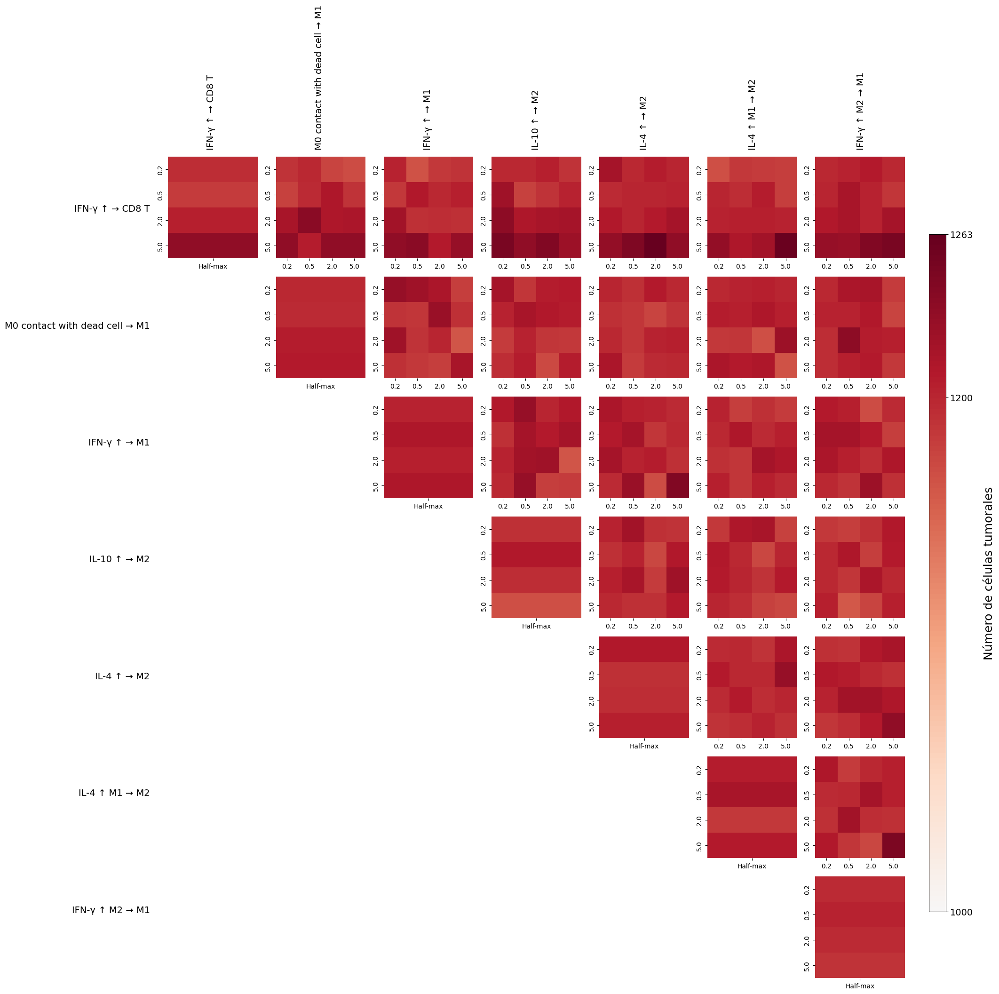

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm
import numpy as np
import re

# Usar df_avg como base
df = df_avg.copy()

# Definir valores de Half-max
HM_values = [0.2, 0.5, 2.0, 5.0]

# Definir nombres de reglas para etiquetas (quitamos la 3)
rule_titles = {
    # 1: "IL-10 ↓ → CD8 T",
    2: "IFN-γ ↑ → CD8 T",
    # 4: "IL-10 ↓ attack tumor",
    5: "M0 contact with dead cell → M1",
    6: "IFN-γ ↑ → M1",
    7: "IL-10 ↑ → M2",
    8: "IL-4 ↑ → M2",
    9: "IL-4 ↑ M1 → M2",
    10: "IFN-γ ↑ M2 → M1"
}

# Obtener las reglas que se usarán
rule_numbers = list(rule_titles.keys())
n_rules = len(rule_numbers)

# Crear una figura para la matriz de heatmaps
fig, axes = plt.subplots(nrows=n_rules, ncols=n_rules, figsize=(18, 18))

max_val = np.nanmax([
    df.loc["tumor", col]
    for col in df.columns
    if (
        col.startswith("rule") and
        "rule1" not in col and
        "rule3" not in col and
        "rule4" not in col and
        not pd.isna(df.loc["tumor", col])
    )
])

min_val = min(
    999,
    np.nanmin([
        df.loc["tumor", col]
        for col in df.columns
        if (
            col.startswith("rule") and
            "rule1" not in col and
            "rule3" not in col and
            "rule4" not in col and
            not pd.isna(df.loc["tumor", col])
        )
    ])
)


# Recorrer la matriz para llenar con los heatmaps
for i, rule_i in enumerate(rule_numbers):
    for j, rule_j in enumerate(rule_numbers):
        ax = axes[i, j]

        if rule_i == rule_j:
            # Heatmaps de variación individual (diagonal)
            pattern = rf"^rule{rule_i}_HM(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM = float(match.group(1))
                    parsed_data[HM] = df.loc["tumor", col]

            heatmap_data = np.full((4, 1), np.nan)
            for HM, value in parsed_data.items():
                heatmap_data[HM_values.index(HM), 0] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=["Half-max"], yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        elif rule_i < rule_j:
            # Heatmaps de comparación de reglas (parte superior)
            pattern = rf"^rule{rule_i}_vs_rule{rule_j}_HM(\d+\.\d+)_(\d+\.\d+)$"
            parsed_data = {}

            for col in df.columns:
                match = re.match(pattern, col)
                if match:
                    HM1, HM2 = map(float, match.groups())
                    parsed_data[(HM1, HM2)] = df.loc["tumor", col]

            heatmap_data = np.full((4, 4), np.nan)
            for (HM1, HM2), value in parsed_data.items():
                heatmap_data[HM_values.index(HM1), HM_values.index(HM2)] = value

            heatmap_data = np.nan_to_num(heatmap_data, nan=0.0)

            norm = TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val)
            sns.heatmap(heatmap_data, annot=False, fmt=".1f", cmap="RdBu_r", 
                        xticklabels=HM_values, yticklabels=HM_values, 
                        ax=ax, cbar=False, norm=norm)

        else:
            # Espacios vacíos en la parte inferior
            ax.axis("off")

# Agregar etiquetas en los márgenes izquierdo y superior
for i, rule in enumerate(rule_titles.values()):
    fig.text(0.0, 0.93 - i * 0.138, rule, va="center", ha="right", fontsize=14, rotation=0)  # Izquierda
    fig.text(0.072 + i * 0.128, 1.0, rule, va="bottom", ha="center", fontsize=14, rotation=90)  # Arriba

# Agregar barra de color
cbar_ax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap="RdBu_r", norm=TwoSlopeNorm(vmin=min_val, vcenter=1000, vmax=max_val))
cbar = fig.colorbar(sm, cax=cbar_ax)

# Recorte visual si no hay valores por debajo de 1000
if min_val == 999:
    cbar.ax.set_ylim(1000, max_val)
    # Definir ticks de 200 en 200 desde 1000 hasta incluir max_val
    ticks = list(np.arange(1000, max_val, 200))
    if ticks[-1] != max_val:
        ticks.append(max_val)
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f"{t:.0f}" for t in ticks])

# Etiqueta y tamaño de fuente
cbar.ax.set_ylabel("Número de células tumorales", fontsize=18, labelpad=15)
cbar.ax.tick_params(labelsize=14)

# Ajustar diseño
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


### Genera cuadros 4x4 con las imagenes finales

In [51]:
# import os
# import matplotlib.pyplot as plt
# import numpy as np
# import re
# from cairosvg import svg2png
# from PIL import Image

# # Diccionario para almacenar rutas de imágenes por combinación de reglas
# image_paths = {}

# # Expresión regular para capturar reglas y valores de Half-max en carpetas
# pattern = r"rule(\d+)_vs_rule(\d+)_HM(\d+\.\d+)_(\d+\.\d+)_rep1$"

# # Recorrer todas las carpetas en base_path
# for folder in os.listdir(base_path):
#     match = re.match(pattern, folder)
#     if match:
#         rule1, rule2, HM1, HM2 = int(match.group(1)), int(match.group(2)), float(match.group(3)), float(match.group(4))

#         # Obtener índices de Half-max para la posición en la matriz
#         if HM1 in HM_values and HM2 in HM_values:
#             index1, index2 = HM_values.index(HM1), HM_values.index(HM2)

#             # Ruta del archivo final.svg dentro de la carpeta
#             svg_path = os.path.join(base_path, folder, "final.svg")
#             png_path = svg_path.replace(".svg", ".png")  # Ruta temporal de la imagen PNG

#             # Si el archivo SVG existe y el PNG aún no, convertirlo a PNG
#             if os.path.exists(svg_path) and not os.path.exists(png_path):
#                 try:
#                     svg2png(url=svg_path, write_to=png_path)  # Convertir SVG a PNG
#                 except Exception as e:
#                     print(f"⚠️ No se pudo convertir {svg_path}: {e}")
#                     continue

#                 if (rule1, rule2) not in image_paths:
#                     image_paths[(rule1, rule2)] = {}
#                 image_paths[(rule1, rule2)][(index1, index2)] = png_path

# # Crear una imagen 4x4 por cada combinación de reglas
# for (rule1, rule2), img_dict in image_paths.items():
#     output_filename = f"imagenes_1000/Rep1/rule{rule1}_vs_rule{rule2}.png"
    
#     # Verificar si la imagen de salida ya existe
#     if not os.path.exists(output_filename):
#         fig, axes = plt.subplots(4, 4, figsize=(10, 10))

#         for (index1, index2), img_path in img_dict.items():
#             ax = axes[index1, index2]
#             try:
#                 img = Image.open(img_path)  # Cargar imagen PNG convertida
#                 ax.imshow(img)
#                 ax.set_title(f"HM1={HM_values[index1]}, HM2={HM_values[index2]}", fontsize=8)
#             except Exception as e:
#                 print(f"⚠️ No se pudo cargar {img_path}: {e}")

#             ax.axis("off")  # Ocultar ejes

#         # Ajustar diseño
#         plt.suptitle(f"Rule {rule1} vs Rule {rule2}", fontsize=14)
#         plt.tight_layout()

#         # Guardar imagen en archivo
#         plt.savefig(output_filename, dpi=300)
#         plt.close()

#         print(f"✅ Imagen guardada: {output_filename}")
#     else:
#         print(f"⚠️ La imagen {output_filename} ya existe. Omitida.")

# print("\n✅ Se generaron todas las imágenes 4x4 por combinación de reglas.")
